# Install and Import Depedencies

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import PIL.Image as pil_image
from PIL import ImageOps
import imutils
from pathlib import Path
import time
import os
from google.colab.patches import cv2_imshow

# Install LightGlue Feature Extractor
if not os.path.exists("LightGlue"):
  print("Installing LightGlue feature extractor.")
  !git clone --quiet https://github.com/cvg/LightGlue/
  %cd LightGlue
  !pip install --progress-bar off --quiet -e .
  %cd ..
else:
  print("LightGlue already installed.")

from lightglue import LightGlue, SuperPoint, DISK
from lightglue.utils import load_image, rbd
from lightglue import viz2d
import torch

# Install Padded Transformations Package for Easy Image Stitching
if not os.path.exists("padded-transformations"):
  print("Installing padded-transformations image warping lib.")
  !git clone --quiet https://github.com/alkasm/padded-transformations.git
  %cd padded-transformations
  !pip install --progress-bar off --quiet .
  %cd ..
else:
  print("padded-transformations already installed.")

import padtransf

# Set GPU params
torch.set_grad_enabled(False)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using '{device}' device.")

Installing LightGlue feature extractor.
/content/LightGlue
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for lightglue (pyproject.toml) ... done
/content


/LightGlue/lightglue/lightglue.py:24: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  @torch.cuda.amp.custom_fwd(cast_inputs=torch.float32)


Installing padded-transformations image warping lib.
/content/padded-transformations
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
/content
Using 'cuda' device.


In [ ]:
# Connect to Google Drive for Data Imports
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Load LightGlue Extractor and Matcher module

In [ ]:
# Load SuperPoint features combined with LightGlue.
extractor = SuperPoint(max_num_keypoints=2048).eval().to(device)  # load the extractor
matcher = LightGlue(features="superpoint").eval().to(device)

# Define Stitching, Blending, Cropping, & Plotting Functions

**Get Lightglue Image Features**

In [ ]:
def get_image_features(image_path0, image_path1, plot=False):

    image0 = load_image(image_path0)
    image1 = load_image(image_path1)
    image0_cv2 = cv2.imread(image_path0)
    image1_cv2 = cv2.imread(image_path1)

    feats0 = extractor.extract(image0.to(device))
    feats1 = extractor.extract(image1.to(device))
    matches01 = matcher({"image0": feats0, "image1": feats1})
    feats0, feats1, matches01 = [
        rbd(x) for x in [feats0, feats1, matches01]
    ]

    kpts0, kpts1, matches = feats0["keypoints"], feats1["keypoints"], matches01["matches"]
    m_kpts0, m_kpts1 = kpts0[matches[..., 0]], kpts1[matches[..., 1]]

    if plot:
      axes = viz2d.plot_images([image0, image1])
      viz2d.plot_matches(m_kpts0, m_kpts1, color="lime", lw=0.2)

    return image0_cv2, image1_cv2, m_kpts0, m_kpts1

**Stitch Images Together**

In [ ]:
def stitch_images(image0, image1, m_kpts0, m_kpts1):
    """Stitches two images together based on keypoints.

    Args:
        image0: The first image as a NumPy array.
        image1: The second image as a NumPy array.
        m_kpts0: Keypoints from the first image.
        m_kpts1: Corresponding keypoints from the second image.

    Returns:
        The stitched image, or None if stitching fails.
    """

    # Convert keypoints to the format expected by cv2.findHomography
    pts1 = np.float32([kp.cpu().numpy() for kp in m_kpts0]).reshape(-1, 1, 2)
    pts2 = np.float32([kp.cpu().numpy() for kp in m_kpts1]).reshape(-1, 1, 2)

    # Find the homography matrix
    H, mask = cv2.findHomography(pts1, pts2, cv2.RANSAC, 400.0)

    if H is None:
        print("Homography estimation failed.")
        return None

    # Warp the images
    # ref: https://stackoverflow.com/questions/46176380/key-point-detection-and-image-stitching
    # ref: https://stackoverflow.com/questions/44457064/displaying-stitched-images-together-without-cutoff-using-warpaffine/44459869#44459869
    dst_padded, src_warped = padtransf.warpPerspectivePadded(image0, image1, H)

    blended = blend_images(dst_padded, src_warped)

    return blended


**Blend Images**

In [ ]:
def blend_images(image_bottom, image_top):
    """
    Processes two images, thresholds them, identifies duplicate white pixels,
    and removes them from one image while combining them.
    """

    # Blend the warped images
    # ref: https://stackoverflow.com/questions/46176380/key-point-detection-and-image-stitching
    # alpha = 0.5
    # beta = 1 - alpha
    # gamma = 1.0
    # blended = cv2.addWeighted(image_top, alpha, image_bottom, beta, gamma)

    img1 = cv2.cvtColor(image_bottom, cv2.COLOR_BGR2GRAY)
    img2 = cv2.cvtColor(image_top, cv2.COLOR_BGR2GRAY)

    # Thresholding
    ret, thresh1 = cv2.threshold(img1, 0, 255, cv2.THRESH_BINARY)
    ret, thresh2 = cv2.threshold(img2, 0, 255, cv2.THRESH_BINARY)

    # Find duplicate white pixels
    duplicate_indices = np.where((thresh1 == 255) & (thresh2 == 255))

    # Remove duplicates from one image (thresh1 in this case)
    img1[duplicate_indices] = 0

    # Combine the images
    blended_image = cv2.bitwise_or(img1, img2)

    return cv2.cvtColor(blended_image, cv2.COLOR_GRAY2BGR)

**Crop Utils**

In [ ]:
class PIXEL_AXIS:
  u_min_val = 0
  u_max_val = 1

def crop_stitched_image(stitched_img):
    """Crops a stitched image to remove black borders."""

    # Add border to the stitched image
    stitched_img = cv2.copyMakeBorder(stitched_img, 10, 10, 10, 10, cv2.BORDER_CONSTANT, (0, 0, 0))

    # Convert image to grayscale
    gray = cv2.cvtColor(stitched_img, cv2.COLOR_BGR2GRAY)

    # Threshold the image
    thresh_img = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]

    # Find contours
    contours = cv2.findContours(thresh_img.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = imutils.grab_contours(contours)

    # Get the largest contour
    areaOI = max(contours, key=cv2.contourArea)

    # Create a mask
    mask = np.zeros(thresh_img.shape, dtype="uint8")
    x, y, w, h = cv2.boundingRect(areaOI)
    cv2.rectangle(mask, (x, y), (x + w, y + h), 255, -1)

    # Erode the mask until it aligns with the image content
    minRectangle = mask.copy()
    sub = mask.copy()
    while cv2.countNonZero(sub) > 0:
        minRectangle = cv2.erode(minRectangle, None)
        sub = cv2.subtract(minRectangle, thresh_img)

    # Find contours of the eroded mask
    contours = cv2.findContours(minRectangle.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = imutils.grab_contours(contours)
    areaOI = max(contours, key=cv2.contourArea)

    # Get the bounding rectangle
    x, y, w, h = cv2.boundingRect(areaOI)

    # Crop the image
    stitched_img = stitched_img[y:y + h, x:x + w]

    return stitched_img

def get_crop_params(img, axis=PIXEL_AXIS.u_max_val):
    # gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # thresh_img = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]
    height = img.shape[0]
    width  = img.shape[1]
    v_max_val = 0
    v_min_val = 0

    if axis == PIXEL_AXIS.u_max_val:
      u = width - 1
    elif axis == PIXEL_AXIS.u_min_val:
      u = 0
    else:
      raise Exception("Invalid axis value")

    # find value of pixel that starts to have values
    for v in range(0, height):
      if img[v, u, 1] > 0:
          v_min_val = v
          break
    # start from the bottom now
    for v in range(height - 1, -1, -1):
      if img[v, u, 1] > 0:
          v_max_val = v
          break

    return v_min_val, v_max_val



**Plot Utils**

In [ ]:
def plot_stiched_image(stitched_image):
  """Plots the stitched image."""
  if stitched_image is not None:
      figure = plt.figure(figsize=(30, 7))
      plt.imshow(stitched_image)
      plt.axis('off')
      plt.grid(False)
      plt.tight_layout()
      plt.show()
  else:
      print("Stitching failed.")


# Image Panorama (Walk-Thru)

**Import Test Images**

In [ ]:
# Define the Image Name
image_name = "img_00100"

# Define Images
ll_img_path = "/content/drive/MyDrive/ColabNotebooks/image-stitching/data/video-stitch/Indoor_P_NS_P0017_MoveForward_LL_20250331_003057/"+ image_name + ".jpg"
lf_img_path = "/content/drive/MyDrive/ColabNotebooks/image-stitching/data/video-stitch/Indoor_P_NS_P0017_MoveForward_LF_20250331_003057/"+ image_name + ".jpg"
rf_img_path = "/content/drive/MyDrive/ColabNotebooks/image-stitching/data/video-stitch/Indoor_P_NS_P0017_MoveForward_RF_20250331_003057/"+ image_name + ".jpg"
rr_img_path = "/content/drive/MyDrive/ColabNotebooks/image-stitching/data/video-stitch/Indoor_P_NS_P0017_MoveForward_RR_20250331_003057/"+ image_name + ".jpg"

**Stitch Left Left (LL) & Left Front (LF) VLC Images**

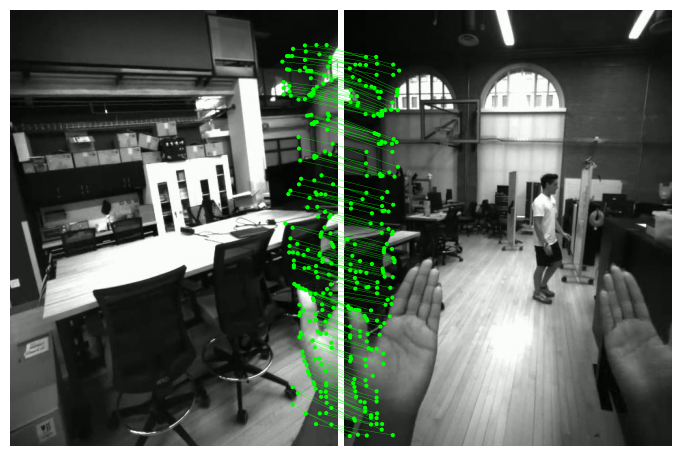

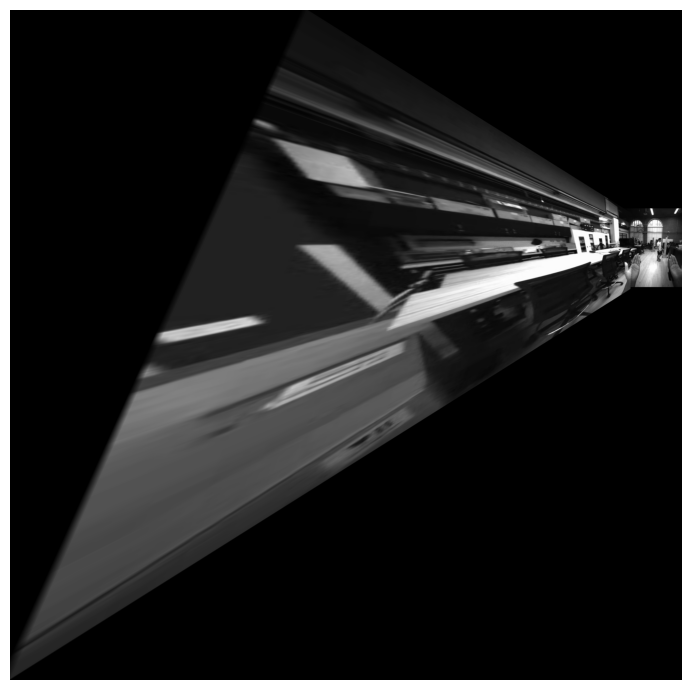

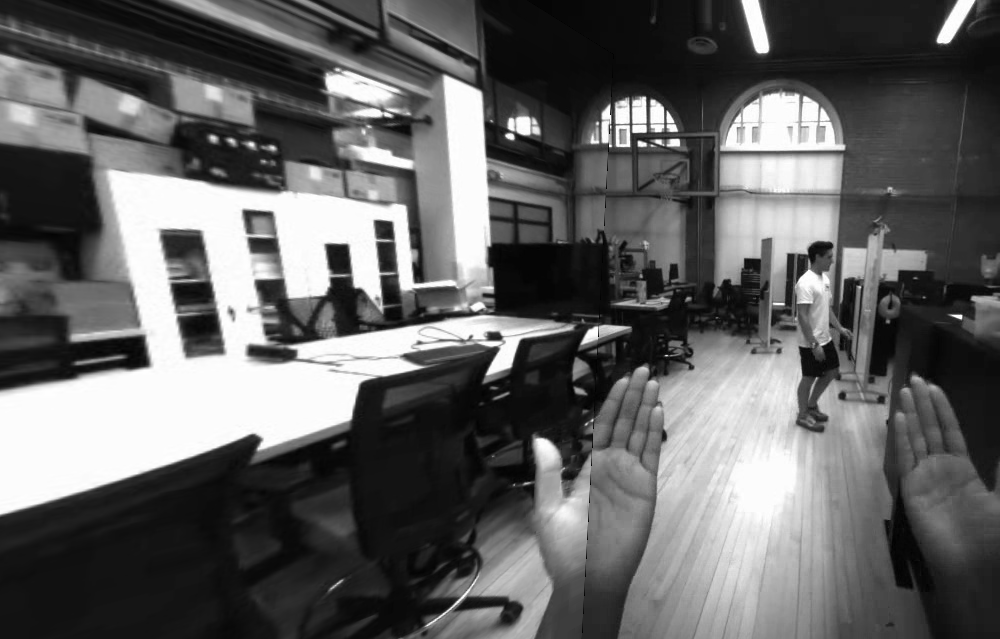

In [ ]:
# get image features
ll_img, lf_img, ll_kpts, lf_kpts = get_image_features(ll_img_path, lf_img_path, plot=True)

# stitch the images together based on the common features
stitched_image_left = stitch_images(ll_img, lf_img, ll_kpts, lf_kpts)

# plot the stitch image (padded and warped)
plot_stiched_image(stitched_image_left)

# find the vertical (v) pixel locations of the non-warped portion of the image
v_min_val, v_max_val = get_crop_params(stitched_image_left, axis=PIXEL_AXIS.u_max_val)

# crop the image based on the values found above
stitched_image_left_pil = pil_image.fromarray(stitched_image_left)
cropped = stitched_image_left_pil.crop((stitched_image_left.shape[1]-1000,
                                        v_min_val,
                                        stitched_image_left.shape[1],
                                        v_max_val))
cropped_stitched_image_left=np.array(cropped)

# plot the image
cv2_imshow(cropped_stitched_image_left)

**Stitch Right Front & Right Right**

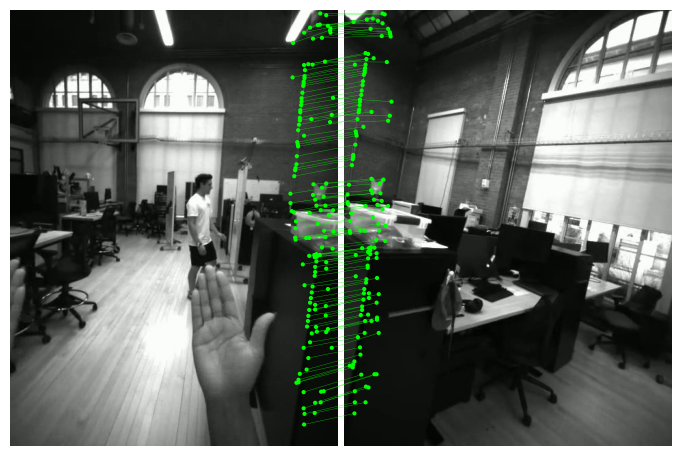

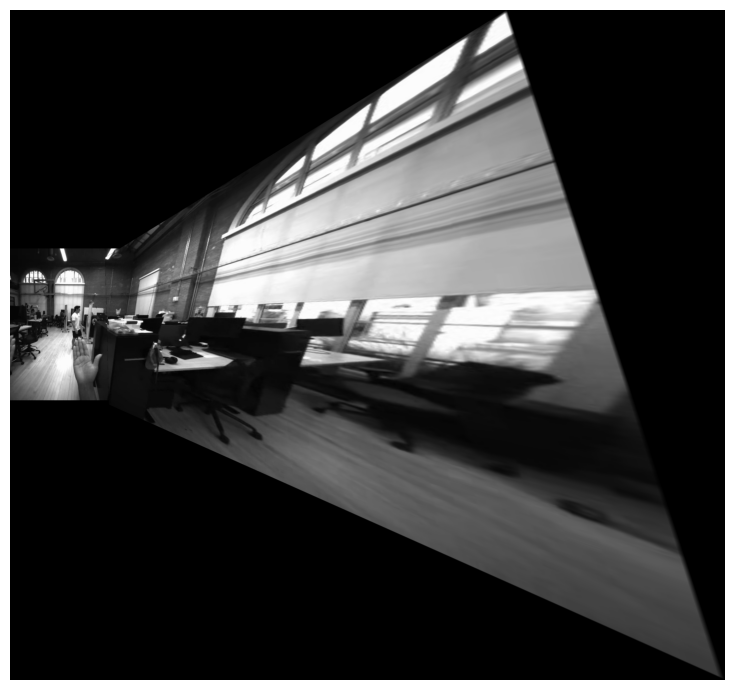

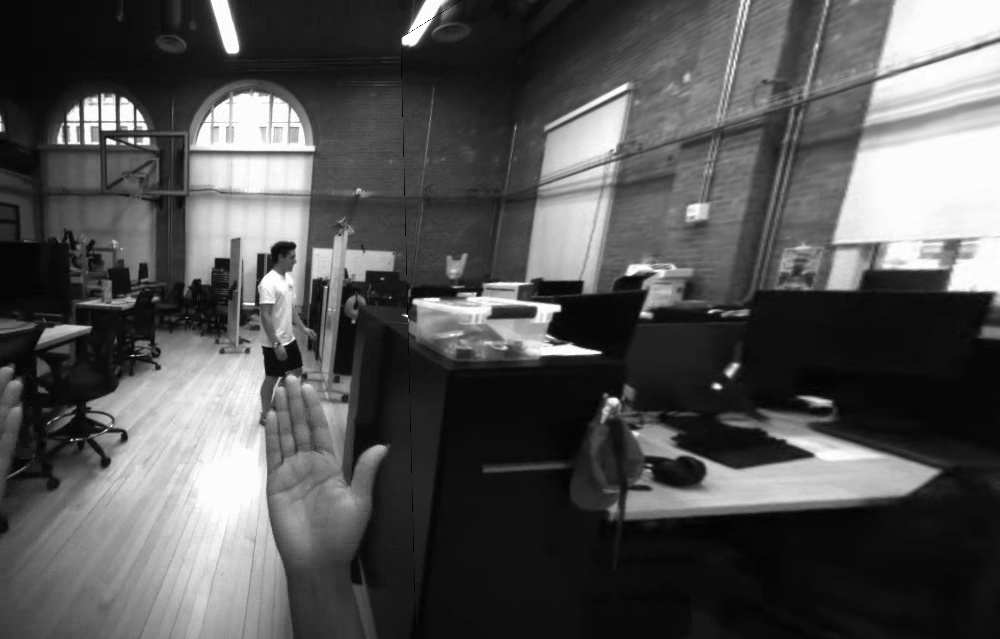

In [ ]:
# get image features
rf_img, rr_img, rf_kpts, rr_kpts = get_image_features(rf_img_path, rr_img_path, plot=True)

# stitch the images together based on the common features
stitched_image_right = stitch_images(rr_img, rf_img, rr_kpts, rf_kpts)

# plot the stitch image (padded and warped)
plot_stiched_image(stitched_image_right)

# find the vertical (v) pixel locations of the non-warped portion of the image
v_min_val, v_max_val = get_crop_params(stitched_image_right, axis=PIXEL_AXIS.u_min_val)

# crop the image based on the values found above
stitched_image_right_pil = pil_image.fromarray(stitched_image_right)
cropped = stitched_image_right_pil.crop((0, v_min_val, 1000, v_max_val))
cropped_stitched_image_right=np.array(cropped)

# plot the image
cv2_imshow(cropped_stitched_image_right)

**Stitch Combined Left and Right Pre-Stitched Images**

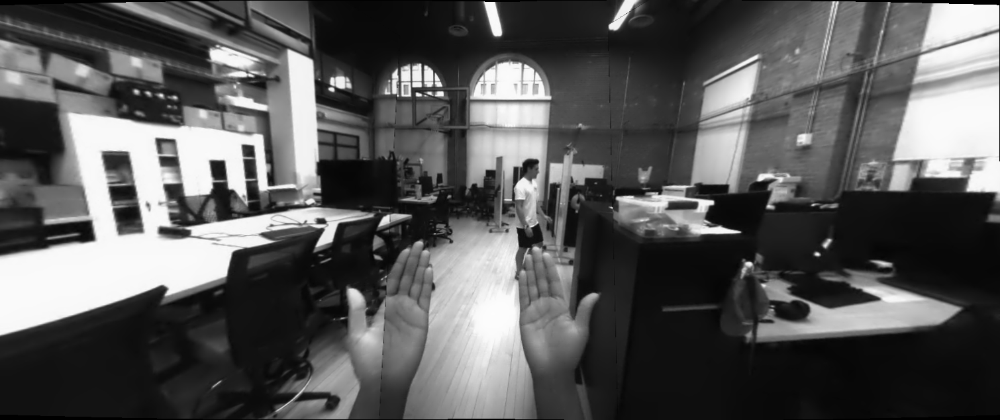

In [ ]:
images = []
images.append(cv2.cvtColor(cropped_stitched_image_left.copy(),cv2.COLOR_BGR2RGB))
images.append(cv2.cvtColor(cropped_stitched_image_right.copy(),cv2.COLOR_BGR2RGB))

num_images = len(images)

# Create stitcher object with wide angle enabled
stitcher = cv2.Stitcher_create()

# Perform stitching
status, result = stitcher.stitch(images)

if status == cv2.Stitcher_OK:
  cv2_imshow(result)
else:
  print("Stitching failed with status:", status)


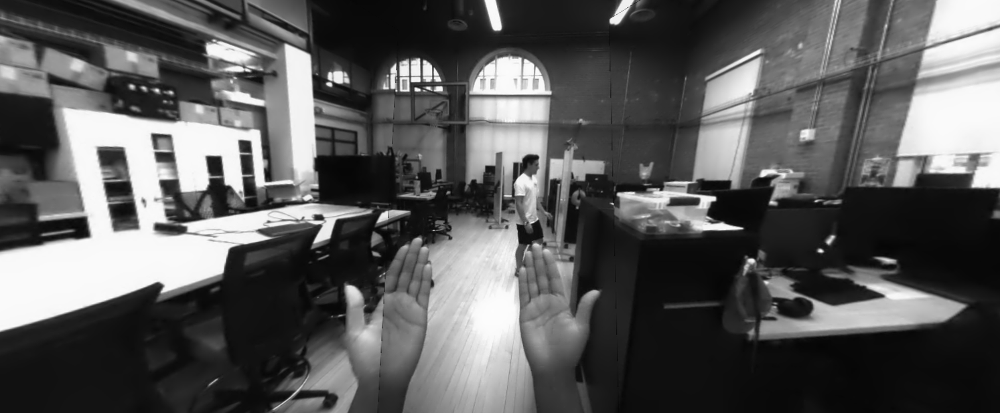

(618, 1493, 3)

In [ ]:
crop_result = crop_stitched_image(result)
cv2_imshow(crop_result)
cv2.imwrite('/content/drive/MyDrive/ColabNotebooks/deictic-pointing-gesture-estimation/data/img-stitch/stitched_image_fixed.jpg', crop_result)
crop_result.shape

# Image Panorama (Streamlined)

In [ ]:
def create_panorama_vlc_frame(ll_img, lf_img, rf_img, rr_img):

  """Create left image"""
  # get the features
  ll_img, lf_img, ll_kpts, lf_kpts = get_image_features(ll_img_path, lf_img_path)

  # stitch based on features
  stitched_image_left = stitch_images(ll_img, lf_img, ll_kpts, lf_kpts)

  # get cropped image to unwarped & unpadded image
  v_min_val, v_max_val = get_crop_params(stitched_image_left, axis=PIXEL_AXIS.u_max_val)
  stitched_image_left_crop_pil = pil_image.fromarray(stitched_image_left).crop((
      stitched_image_left.shape[1]-1000, # left-most u value
      v_min_val,                         # top-most v value
      stitched_image_left.shape[1],      # right-most u value
      v_max_val))                        # bottom-most v value
  stitched_image_left_crop = np.array(stitched_image_left_crop_pil)

  """Create right image"""
  # get the features
  rf_img, rr_img, rf_kpts, rr_kpts = get_image_features(rf_img_path, rr_img_path)

  # stitch based on features
  stitched_image_right = stitch_images(rr_img, rf_img, rr_kpts, rf_kpts)

  # get cropped image to unwarped & unpadded image
  v_min_val, v_max_val = get_crop_params(stitched_image_right, axis=PIXEL_AXIS.u_min_val)
  stitched_image_right_crop_pil = pil_image.fromarray(stitched_image_right).crop((
      0,
      v_min_val,
      1000,
      v_max_val))
  stitched_image_right_crop = np.array(stitched_image_right_crop_pil)

  # images = []
  # images.append(cv2.cvtColor(stitched_image_left_crop,cv2.COLOR_BGR2RGB))
  # images.append(cv2.cvtColor(stitched_image_right_crop,cv2.COLOR_BGR2RGB))


  # Create stitcher object with wide angle enabled
  stitcher = cv2.Stitcher_create()

  if stitched_image_left_crop is not None and stitched_image_right_crop is not None:
    # Perform stitching
    status, result = stitcher.stitch([cv2.cvtColor(stitched_image_left_crop,cv2.COLOR_BGR2RGB),
                                      cv2.cvtColor(stitched_image_right_crop,cv2.COLOR_BGR2RGB)])


    # Create stitcher object with wide angle enabled
    stitcher = cv2.Stitcher_create()

    # Perform stitching
    status, result = stitcher.stitch([cv2.cvtColor(stitched_image_left_crop,cv2.COLOR_BGR2RGB),
                                      cv2.cvtColor(stitched_image_right_crop,cv2.COLOR_BGR2RGB)])
  else:
    result = None
  return result


def pad_image(image_path, target_size=(640, 1600)):
    img = pil_image.fromarray(image_path)
    width, height = img.size

    # Calculate padding
    left = (target_size[1] - width) // 2
    top = (target_size[0] - height) // 2
    right = target_size[1] - width - left
    bottom = target_size[0] - height - top

    # Pad the image
    padded_img = ImageOps.expand(img, border=(left, top, right, bottom), fill=(0,0,0))

    return np.array(padded_img)


Paronamic image generation took '1.257's using an 'NVIDIA A100-SXM4-40GB' gpu.


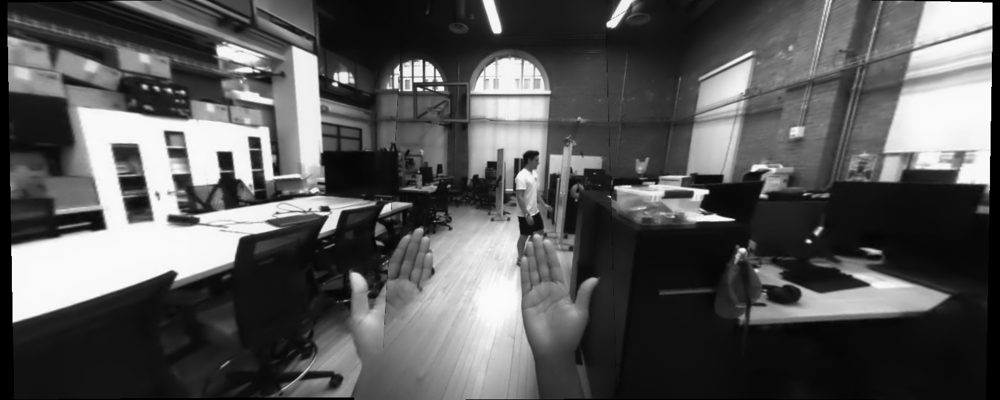

In [ ]:
# Define the Image Name
image_name = "img_00100"

# Define Images
ll_img_path = "/content/drive/MyDrive/ColabNotebooks/image-stitching/data/video-stitch/Indoor_P_NS_P0017_MoveForward_LL_20250331_003057/"+ image_name + ".jpg"
lf_img_path = "/content/drive/MyDrive/ColabNotebooks/image-stitching/data/video-stitch/Indoor_P_NS_P0017_MoveForward_LF_20250331_003057/"+ image_name + ".jpg"
rf_img_path = "/content/drive/MyDrive/ColabNotebooks/image-stitching/data/video-stitch/Indoor_P_NS_P0017_MoveForward_RF_20250331_003057/"+ image_name + ".jpg"
rr_img_path = "/content/drive/MyDrive/ColabNotebooks/image-stitching/data/video-stitch/Indoor_P_NS_P0017_MoveForward_RR_20250331_003057/"+ image_name + ".jpg"

# Profile Run
start_time = time.time()

# Get the Panoramic Image of the VLC Frame
vlc_panorama = create_panorama_vlc_frame(ll_img_path, lf_img_path, rf_img_path, rr_img_path)
vlc_panorama_padded = pad_image(vlc_panorama)

# Print Profile Results
end_time = time.time()
duration = end_time-start_time
print(f"Paronamic image generation took '{duration:.3f}'s using an '{torch.cuda.get_device_name(0)}' gpu.")

# Show Images
cv2_imshow(vlc_panorama_padded)

# Video Panorama (Streamlined)

In [ ]:
import glob
ll_imagefiles = glob.glob('/content/drive/MyDrive/ColabNotebooks/image-stitching/data/video-stitch/Indoor_P_NS_P0017_MoveForward_LL_20250331_003057/*')
lf_imagefiles = glob.glob('/content/drive/MyDrive/ColabNotebooks/image-stitching/data/video-stitch/Indoor_P_NS_P0017_MoveForward_LF_20250331_003057/*')
rf_imagefiles = glob.glob('/content/drive/MyDrive/ColabNotebooks/image-stitching/data/video-stitch/Indoor_P_NS_P0017_MoveForward_RF_20250331_003057/*')
rr_imagefiles = glob.glob('/content/drive/MyDrive/ColabNotebooks/image-stitching/data/video-stitch/Indoor_P_NS_P0017_MoveForward_RR_20250331_003057/*')

ll_imagefiles.sort()
lf_imagefiles.sort()
rf_imagefiles.sort()
rr_imagefiles.sort()

range_min = 80
range_max = 110
ll_imagefiles = ll_imagefiles[range_min:range_max]
lf_imagefiles = lf_imagefiles[range_min:range_max]
rf_imagefiles = rf_imagefiles[range_min:range_max]
rr_imagefiles = rr_imagefiles[range_min:range_max]

print(len(ll_imagefiles))

30


In [ ]:
if (len(ll_imagefiles) != len(lf_imagefiles) or
    len(ll_imagefiles) != len(rf_imagefiles) or
    len(ll_imagefiles) != len(rr_imagefiles)):
  raise Exception("Number")

Skipping frame 0: Panorama Image Empty.
Skipping frame 1: Panorama Image Empty.
Skipping frame 2: Panorama Image Empty.


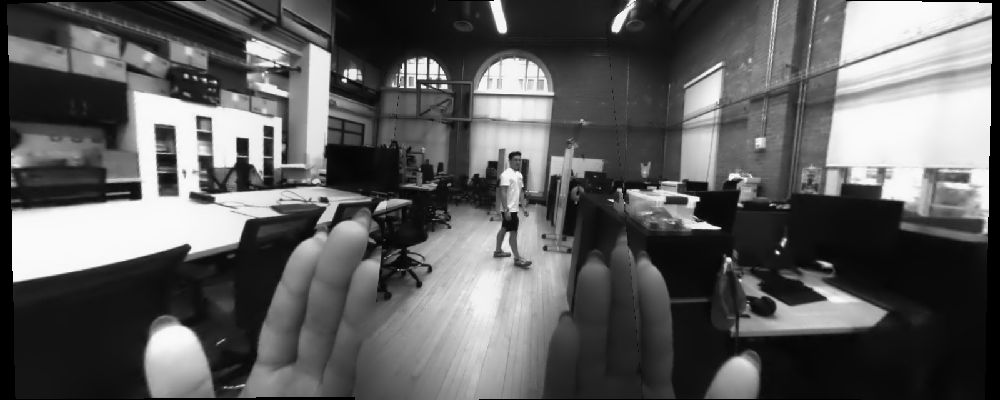

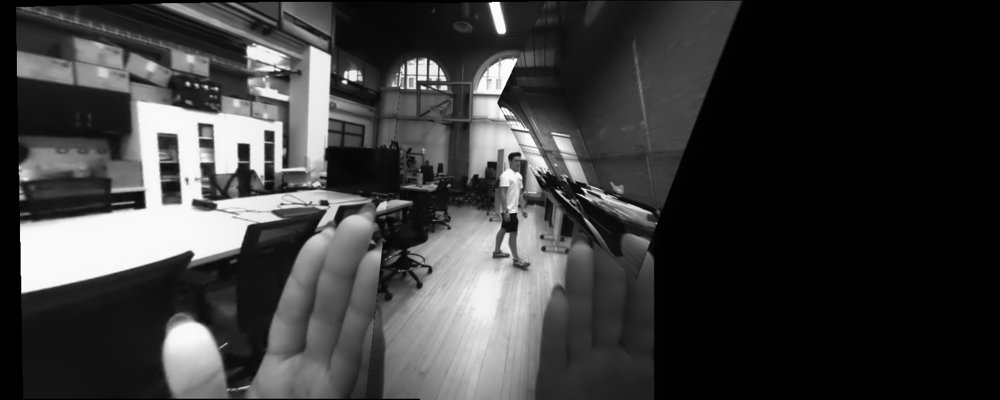

Skipping frame 5: Panorama Image Empty.
Skipping frame 6: Panorama Image Empty.


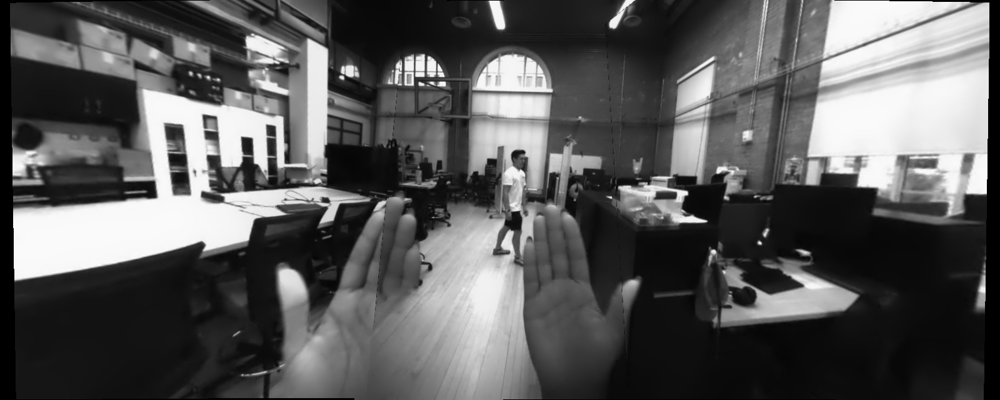

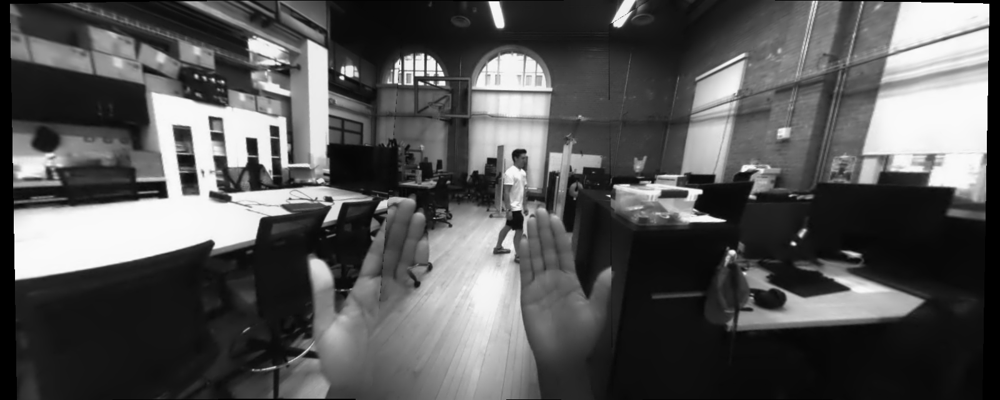

Skipping frame 9: Panorama Image Empty.
Skipping frame 10: Panorama Image Empty.


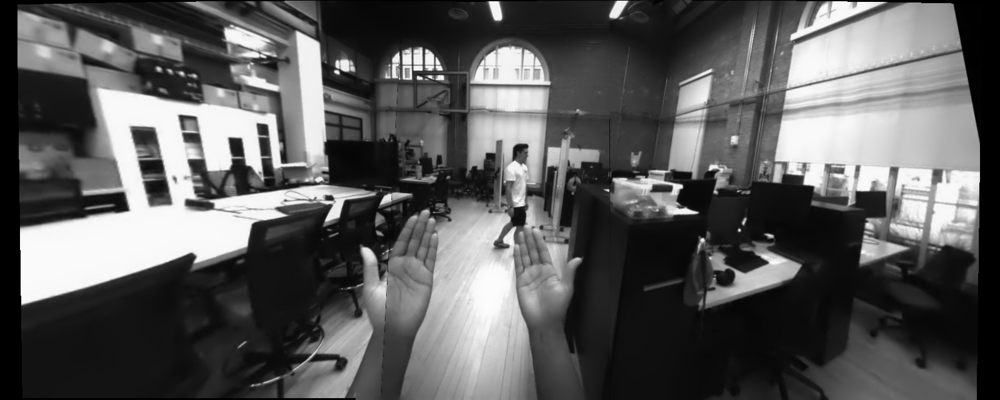

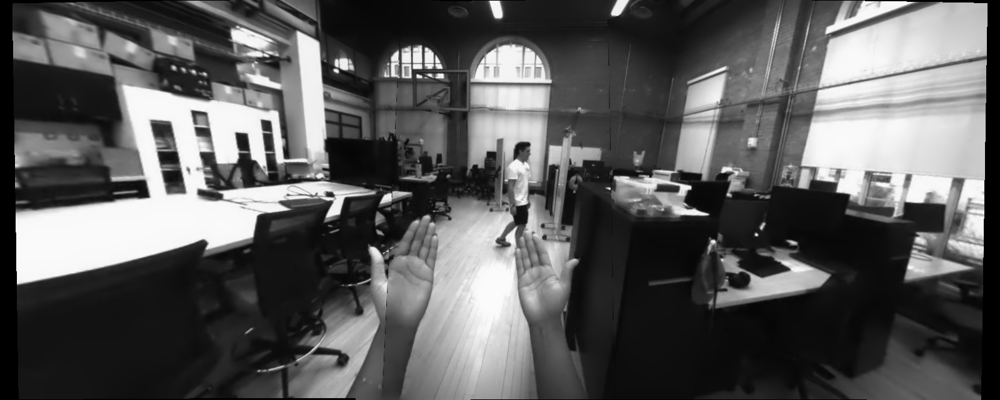

Skipping frame 13: Panorama Image Empty.
Skipping frame 14: Panorama Image Empty.


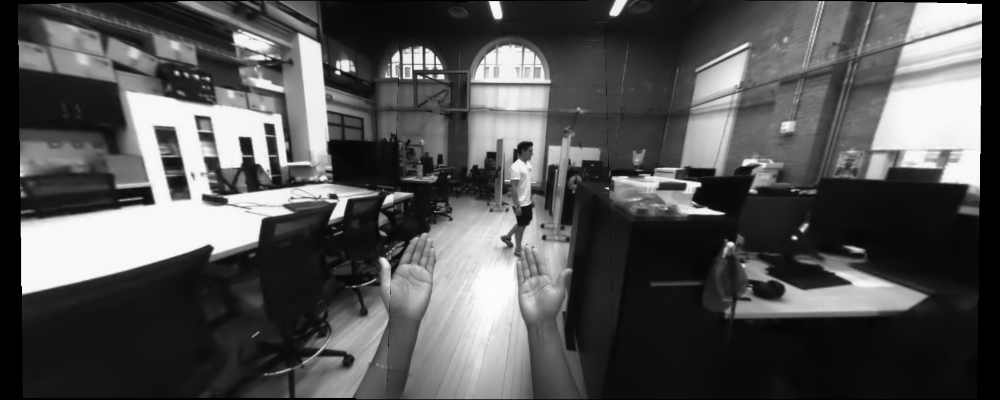

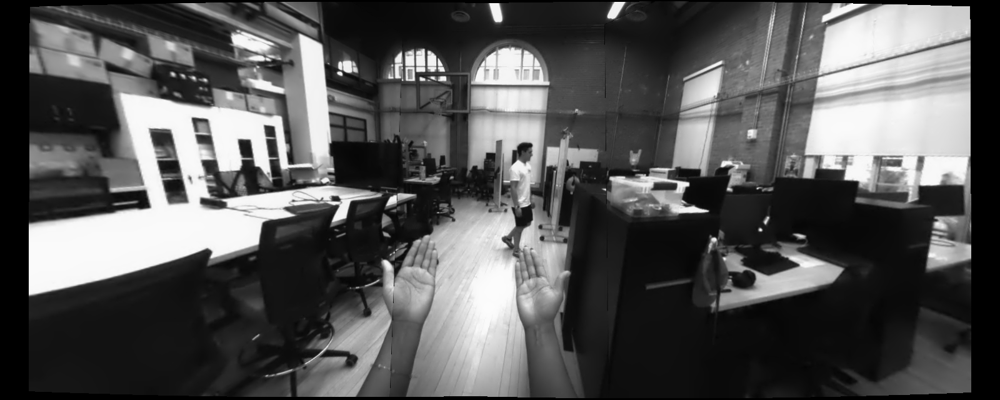

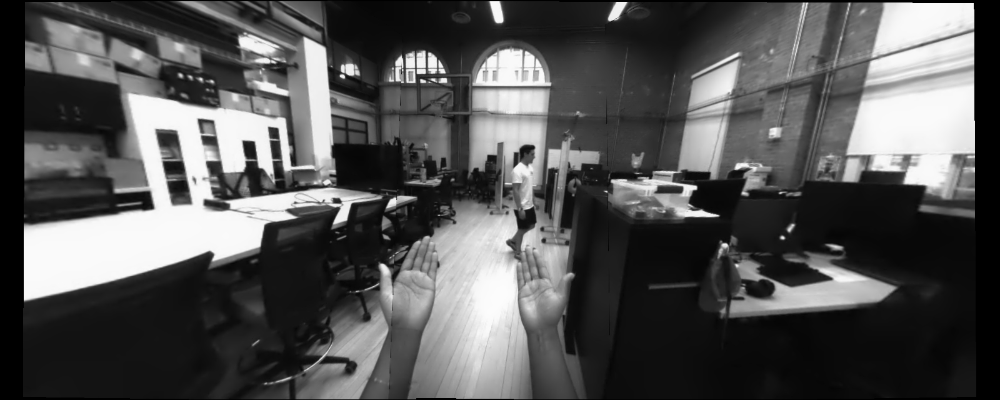

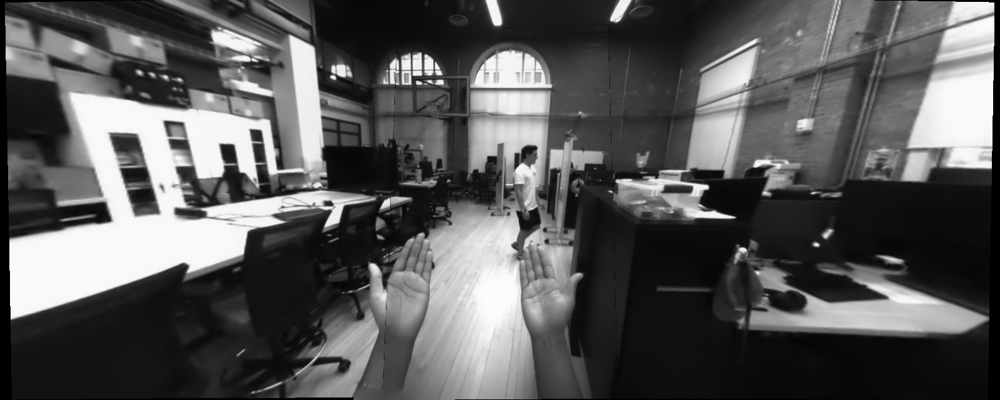

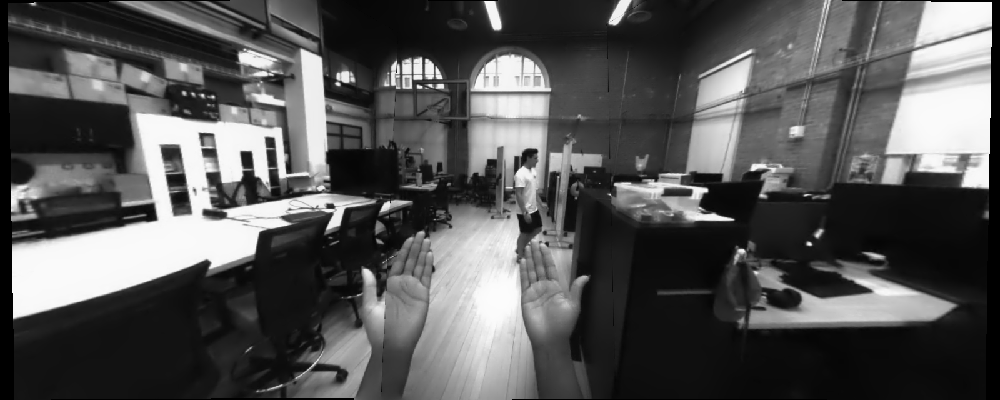

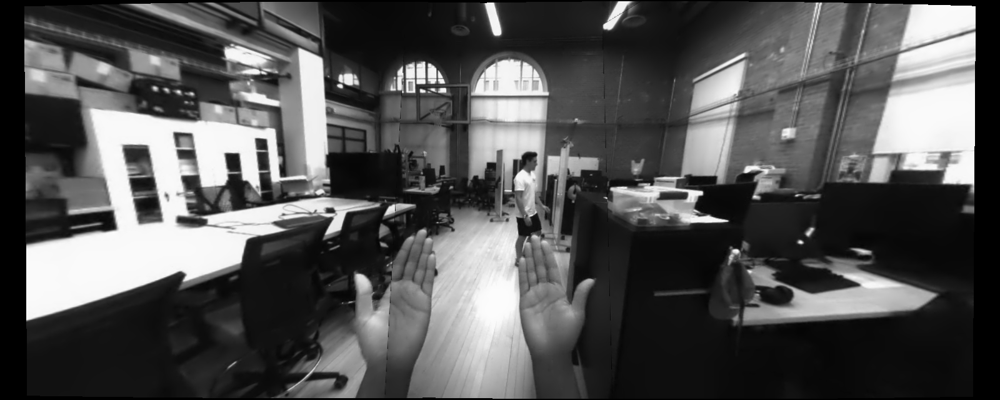

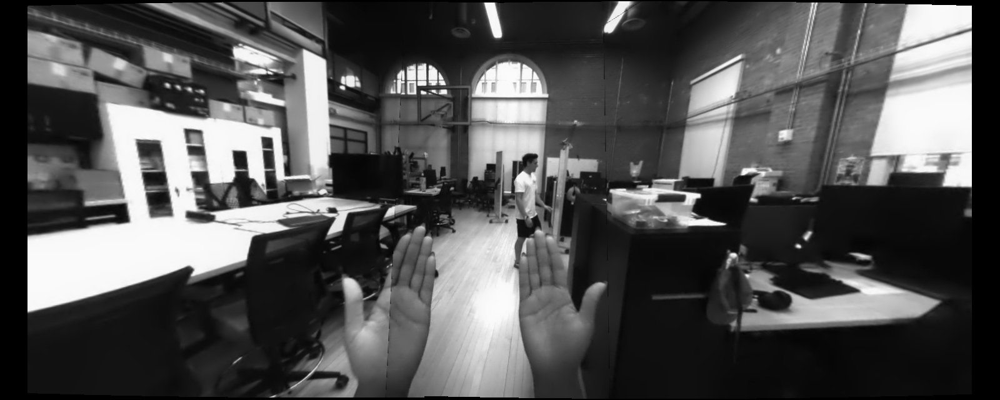

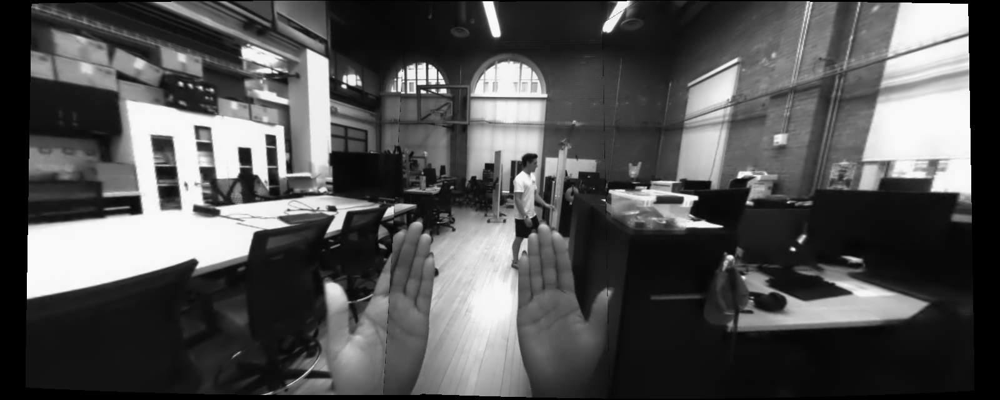

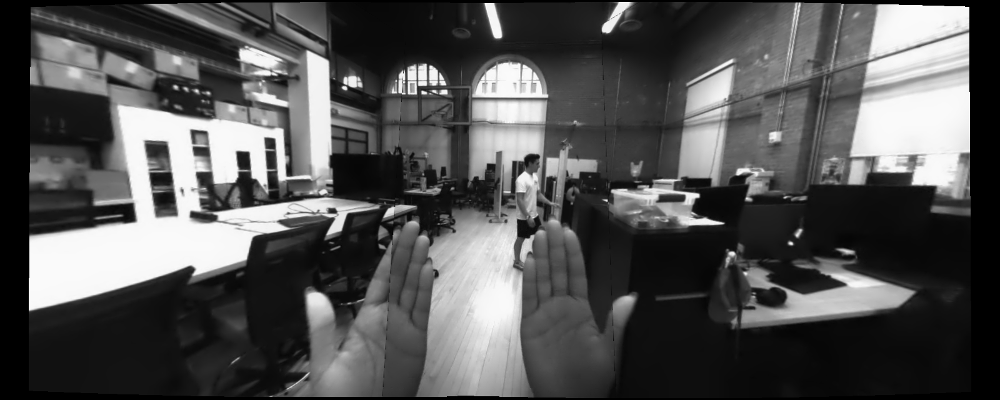

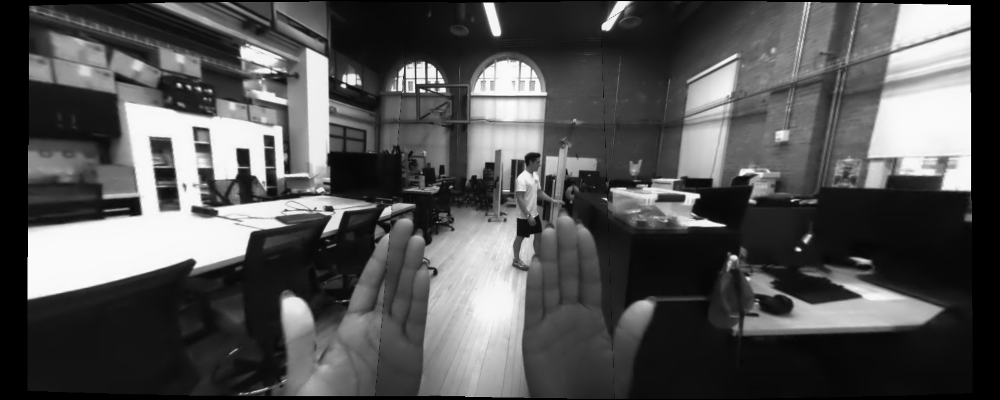

Skipping frame 25: Error occurred.


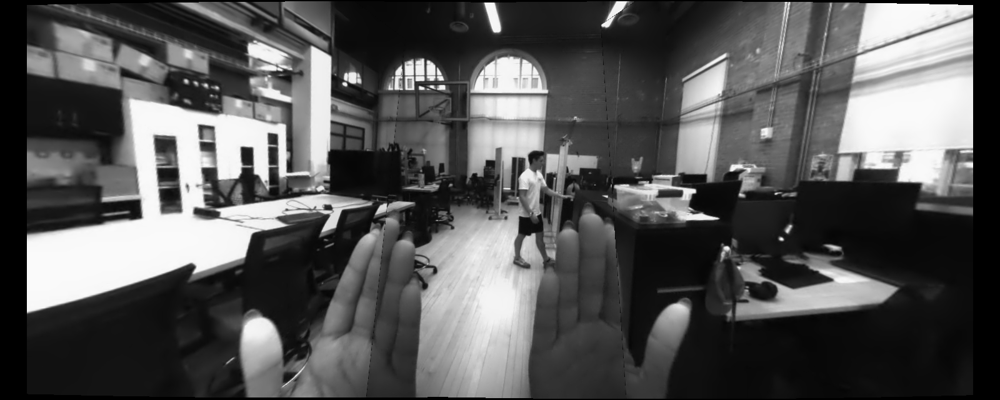

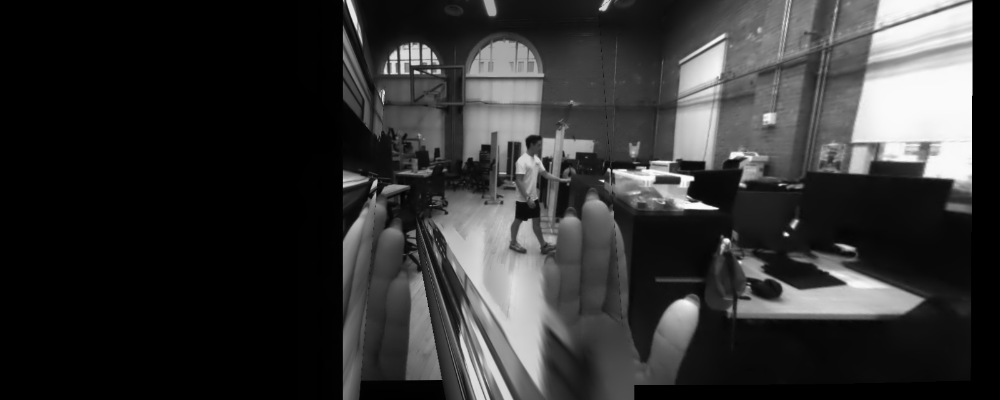

In [ ]:
# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'mp4v') # You can change the codec if needed
out = cv2.VideoWriter('/content/drive/MyDrive/ColabNotebooks/image-stitching/data/output_video.mp4', fourcc, 30.0, (640, 1600)) # Replace with desired output path and resolution

for i in range(len(ll_imagefiles)):
  try:
    ll_img_path = ll_imagefiles[i]
    lf_img_path = lf_imagefiles[i]
    rf_img_path = rf_imagefiles[i]
    rr_img_path = rr_imagefiles[i]

    vlc_panorama = create_panorama_vlc_frame(ll_img_path, lf_img_path, rf_img_path, rr_img_path)

    # Check if the panorama creation was successful
    if vlc_panorama is not None:
      vlc_panorama_padded = pad_image(vlc_panorama)

      # Convert the image to BGR (OpenCV's default color format) if necessary
      # vlc_panorama_bgr = cv2.cvtColor(vlc_panorama, cv2.COLOR_RGB2BGR) # Uncomment if needed
      out.write(vlc_panorama_padded)

      cv2_imshow(vlc_panorama_padded)
      cv2.waitKey(1)
    else:
      print(f"Skipping frame {i}: Panorama Image Empty.")
  except:
    print(f"Skipping frame {i}: Error occurred.")

# Release everything if job is finished
out.release()
